<a href="https://colab.research.google.com/github/b-kh/ultralytics/blob/main/EDP_08_08_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Training YOLOv5 custom dataset with Estrus detection in dairy cow recorded photos**

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
CD_ROOT="/content/drive/MyDrive/yolos"
print(CD_ROOT)

/content/drive/MyDrive/yolos


In [5]:
ls

drive/  sample_data/


In [ ]:
!python -m pip install --upgrade pip
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install torch
!pip install tensorflow
!pip install tensorboard
!pip install ultralytics
import ultralytics
from ultralytics.utils.plotting import Annotator
from IPython.display import display
from PIL import Image
from IPython.display import Image
import shutil
import os, sys

# **making folder to training by name yolov5_bkh**

In [ ]:
import os

# Define the root directory where you want to create the folders
CD_ROOT = '/content/drive/MyDrive/yolos'  # Replace with the actual path

# Change the current working directory to CD_ROOT
os.chdir(CD_ROOT)

# Create the main folder 'yolov5_bkh' if it doesn't exist
if not os.path.exists('yolov5_bkh'):
    os.mkdir('yolov5_bkh')

# Navigate to 'yolov5_bkh' directory
os.chdir('yolov5_bkh')

# Create 'data' folder inside 'yolov5_bkh' if it doesn't exist
if not os.path.exists('data'):
    os.mkdir('data')

print("Congratulations! Folders 'yolov5_bkh' and 'data' now exist.")


Congratulations! Folders 'yolov5_bkh' and 'data' now exist.


# **unzipping data to dataset folder**

In [19]:
import shutil
import os

# Define root directory path (replace with your actual path)
CD_ROOT = "/content/drive/MyDrive/yolos"

# Change current directory to the target folder
os.chdir(os.path.join(CD_ROOT, "yolov5_bkh", "data"))

# Define the path to the zip file
obj = '/content/drive/MyDrive/dataset/Data5200.zip'

# Check if the zip file exists
if os.path.isfile(obj):
    print(f"Data are unzipping from {obj}")
    shutil.unpack_archive(obj, "objects")  # Unzips into 'objects' folder
else:
    # If zip file is not found, check if 'objects' folder exists
    if os.path.exists('objects'):
        print(f"Data are copying from {obj}")
        shutil.unpack_archive(obj, "objects")
    else:
        print(f"{obj} not found")

print("Finished")

# Optional: Uncomment to print the number of items in the unzipped directory
# obj_dir = os.path.join(CD_ROOT, 'yolov5_bkh', 'data', 'objects', 'datamix5200')
# print(len(os.listdir(obj_dir)))


/content/drive/MyDrive/dataset/Data5200.zip not found
Finished


# **making dataset and split to train and validation data**

In [17]:
import os
import shutil
import random
# Define root directory path (replace with your actual path)
CD_ROOT = "/content/drive/MyDrive/yolos"

split_percentage=80

# Change current directory to the target folder
os.chdir(os.path.join(CD_ROOT, "yolov5_bkh", "data"))

def create_directory_structure(base_dir):
    """Creates train/valid directory structure with images/labels subdirectories."""
    train_images_path = os.path.join(base_dir, 'train/images')
    train_labels_path = os.path.join(base_dir, 'train/labels')
    valid_images_path = os.path.join(base_dir, 'valid/images')
    valid_labels_path = os.path.join(base_dir, 'valid/labels')

    for path in [train_images_path, train_labels_path, valid_images_path, valid_labels_path]:
        if os.path.exists(path):
            shutil.rmtree(path)
        os.makedirs(path)

    return train_images_path, train_labels_path, valid_images_path, valid_labels_path

def get_files_list(full_data_path, extension_allowed):
    """Gets a list of filenames without extension from the full_data_path."""
    files = []
    ext_len = len(extension_allowed)

    for root, dirs, filenames in os.walk(full_data_path):
        for file in filenames:
            if file.endswith(extension_allowed):
                strip = file[0:len(file) - ext_len]  # Remove the extension
                files.append(strip)

    return files

def copy_files(files, full_data_path, dest_images_path, dest_labels_path, extension_allowed):
    """Copy image and label files to the destination directories."""
    for strip in files:
        # Copy image
        image_file = strip + extension_allowed
        src_image = os.path.join(full_data_path, image_file)
        shutil.copy(src_image, dest_images_path)

        # Copy label
        annotation_file = strip + '.txt'
        src_label = os.path.join(full_data_path, annotation_file)
        shutil.copy(src_label, dest_labels_path)

def split_dataset(full_data_path, extension_allowed='.jpg', split_percentage=80):
    """Splits dataset into train and valid sets with images and labels."""
    # Create the directory structure
    train_images_path, train_labels_path, valid_images_path, valid_labels_path = create_directory_structure('../data')

    # Get the list of files without extension
    files = get_files_list(full_data_path, extension_allowed)

    # Shuffle the files
    random.shuffle(files)

    # Determine the split point
    size = len(files)
    split = int(split_percentage * size / 100)

    # Copy files to train directory
    print("Copying training data...")
    copy_files(files[:split], full_data_path, train_images_path, train_labels_path, extension_allowed)

    # Copy files to valid directory
    print("Copying validation data...")
    copy_files(files[split:], full_data_path, valid_images_path, valid_labels_path, extension_allowed)

    # Summary
    print("Finished")
    print("Training images:", len(files[:split]))
    print("Validation images:", len(files[split:]))
    print("Total number of images:", size)

# Example usage
full_data_path = 'objects/Data5200'  # Path to your dataset containing images and labels
split_dataset(full_data_path)


Copying training data...
Copying validation data...
Finished
Training images: 0
Validation images: 0
Total number of images: 0


# **making configuration yaml file**

In [8]:
import os

# Define root directory path (replace with your actual path)
CD_ROOT = "/content/drive/MyDrive/yolos"

# Change the directory to yolov5_bkh/data
os.chdir(os.path.join(CD_ROOT, "yolov5_bkh", "data"))

# Check if the Estrus.yaml file exists
if not os.path.exists('Estrus.yaml'):
    with open("Estrus.yaml", "a") as f:
        f.write("train: ../data/train/images/\n")
        f.write("val: ../data/valid/images/\n")
        f.write("nc: 1\n")
        f.write("names: ['MOUNTING ,گاو فحل']\n")
    print("Estrus.yaml file created")
else:
    print("Estrus.yaml already exists in the data folder")


Estrus.yaml already exists in the data folder


In [ ]:
!pip install ultralytics
import ultralytics
from ultralytics.utils.plotting import Annotator

# **installing yolov5 from github**

Changing directory to /content/drive/MyDrive/yolos/yolov5_bkh/yolov5
Running detection with yolov5s.pt...


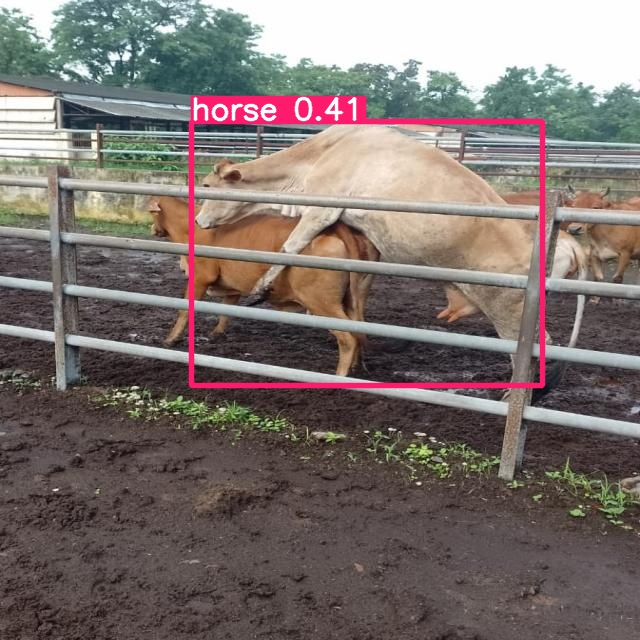

Running detection with yolov5m.pt...


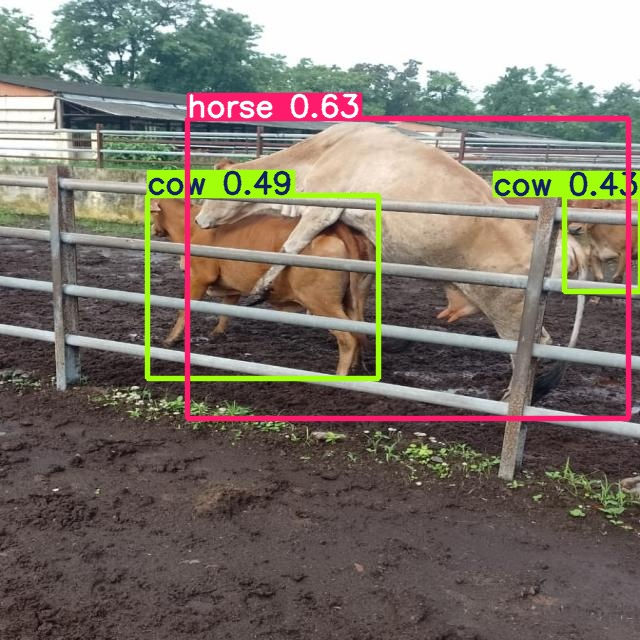

Running detection with yolov5l.pt...


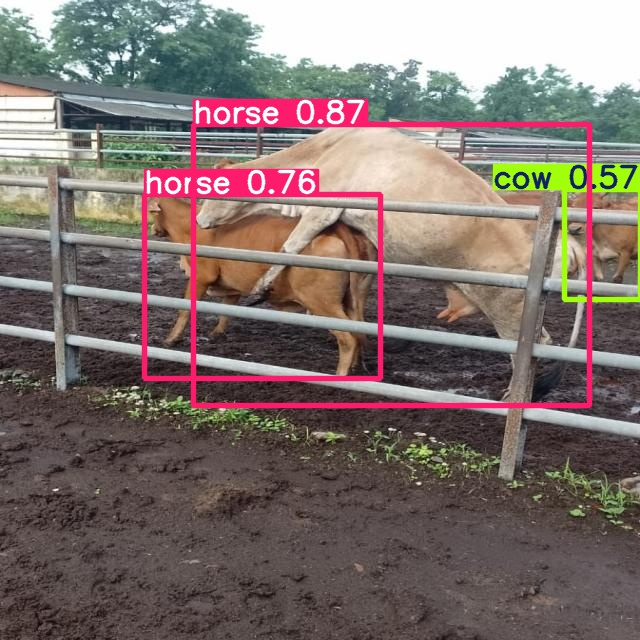

Running detection with yolov5x.pt...


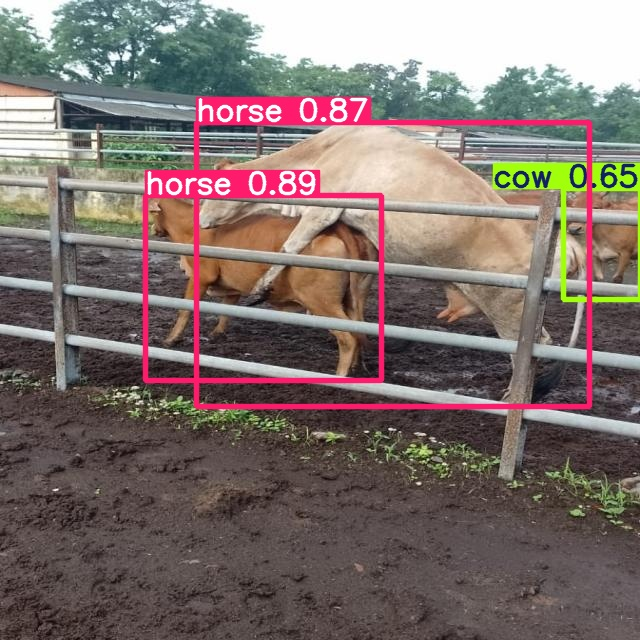

In [12]:
import subprocess
import os
from IPython.display import Image, display

# Set the actual directory path
cd_root = "/content/drive/MyDrive/yolos/yolov5_bkh/yolov5"

# Define the commands to run detection with different YOLOv5 model weights
commands = [
    {
        "weights": "yolov5s.pt",
        "name": "exp"  # Save results in "exp"
    },
    {
        "weights": "yolov5m.pt",
        "name": "exp2"  # Save results in "exp2"
    },
    {
        "weights": "yolov5l.pt",
        "name": "exp3"  # Save results in "exp3"
    },
    {
        "weights": "yolov5x.pt",
        "name": "exp4"  # Save results in "exp4"
    }
]

# Change to the specified directory
print(f"Changing directory to {cd_root}")
os.chdir(cd_root)  # Ensure the path is correct

# Iterate over the commands and run them
for cmd in commands:
    # Run the detect.py command with the specified weights and source image
    print(f"Running detection with {cmd['weights']}...")

    try:
        # Run the detection and save each result in a unique folder (exp, exp2, exp3, ...)
        subprocess.run([
            "python", "detect.py",
            "--weights", cmd["weights"],
            "--conf-thres", "0.4",
            "--source", "/content/drive/MyDrive/yolos/dataset/cow2.jpg",
            "--project", "runs/detect",  # Specify the base directory
            "--name", cmd["name"]        # Specify the folder name (exp, exp2, exp3, etc.)
        ], check=True)

        # Display the resulting image
        output_path = os.path.join("runs", "detect", cmd["name"], "cow2.jpg")
        if os.path.exists(output_path):
            display(Image(filename=output_path))  # Use display() function properly
        else:
            print(f"Output image not found at {output_path}.")

    except subprocess.CalledProcessError as e:
        print(f"Error occurred while running detection with {cmd['weights']}: {e}")


#**Detection By Yolov5S,M,L,X In coco128(Base of yolov5) Pretranied - تشخیص اشیا با مدل پیش آموزش دیده**

In [ ]:
!pip install -U tensorboard-plugin-profile

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5s.pt
    weights = "yolov5s.pt"
    print("Starting training from yolov5s.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


# **train by Yolov5s**

# **epochs= 20 Yolov5s**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5s.pt"
    print("Starting training from yolov5s.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


# **epochs= 40 Yolov5s**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5s.pt"
    print("Starting training from yolov5s.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 40 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


# **epochs= 60 Yolov5s**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5s.pt"
    print("Starting training from yolov5s.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 60 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


In [ ]:
import subprocess
import os
from IPython.display import Image, display

# Set the actual directory path
cd_root = "/content/drive/MyDrive/yolos/yolov5_bkh/yolov5"  # Replace with your actual path

# Define the commands to run detection with different YOLOv5 model weights
commands = [
    {
        "weights": "best.pt",
        "name": "exp5"   # Save results in "exp"
    },
    {
        "weights": "best.pt",
        "name": "exp6"  # Save results in "exp2"
    },
    {
        "weights": "best.pt",
        "name": "exp7"  # Save results in "exp3"
    }
]

# Iterate over the commands and run them
for cmd in commands:
    # Change to the specified directory
    print(f"Changing directory to {cd_root}")
    os.chdir(cd_root)  # Ensure the path is correct

    # Run the detect.py command with the specified weights and source image
    print(f"Running detection with {cmd['weights']}...")

    # Run the detection and save each result in a unique folder (exp, exp2, exp3, ...)
    subprocess.run([
        "python", "detect.py",
        "--weights", cmd["weights"],
        "--conf-thres", "0.4",
        "--source", "/content/drive/MyDrive/yolos/dataset/cow2.jpg",
        "--project", "runs/detect",  # Specify the base directory
        "--name", cmd["name"]        # Specify the folder name (exp, exp2, exp3, etc.)
    ])

    # Display the resulting image
    output_path = os.path.join("runs", "detect", cmd["name"], "cow2.jpg")
    display(Image(filename=output_path))  # Use display() function properly


In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

# **train by Yolov5m**

# **epochs= 20 Yolov5m**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5m.pt"
    print("Starting training from yolov5m.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


# **epochs= 40 Yolov5m**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5m.pt"
    print("Starting training from yolov5m.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 40 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


# **epochs= 60 Yolov5m**

In [ ]:
import os

# Define the paths
CD_ROOT = "/content/drive/MyDrive/yolos"  # Define your root directory here
weights_path = os.path.join(CD_ROOT, "yolov5_bkh", "yolov5", "last.pt")

# Check if last.pt exists
if os.path.exists(weights_path):
    # If last.pt exists, continue training from it
    weights = weights_path
    print("Resuming training from last.pt")
else:
    # Otherwise, start training from scratch with yolov5l.pt
    weights = "yolov5m.pt"
    print("Starting training from yolov5m.pt")

# Change directory to YOLOv5
%cd {CD_ROOT}/yolov5_bkh/yolov5

# Run training command
!python train.py --img 640 --batch 16 --epochs 60 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights {weights}


In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

## **Detection by trained model s & m with epochs 20 & 40 & 60**

In [ ]:
import subprocess
import os
from IPython.display import Image, display

# Set the actual directory path
cd_root = "/content/drive/MyDrive/yolos/yolov5_bkh/yolov5"  # Replace with your actual path

# Define the commands to run detection with different YOLOv5 model weights
commands = [
    {
        "weights": "best.pt",
        "name": "exp8"   # Save results in "exp"
    },
    {
        "weights": "best.pt",
        "name": "exp9"  # Save results in "exp2"
    },
    {
        "weights": "best.pt",
        "name": "exp10"  # Save results in "exp3"
    }
]

# Iterate over the commands and run them
for cmd in commands:
    # Change to the specified directory
    print(f"Changing directory to {cd_root}")
    os.chdir(cd_root)  # Ensure the path is correct

    # Run the detect.py command with the specified weights and source image
    print(f"Running detection with {cmd['weights']}...")

    # Run the detection and save each result in a unique folder (exp, exp2, exp3, ...)
    subprocess.run([
        "python", "detect.py",
        "--weights", cmd["weights"],
        "--conf-thres", "0.4",
        "--source", "/content/drive/MyDrive/yolos/dataset/cow2.jpg",
        "--project", "runs/detect",  # Specify the base directory
        "--name", cmd["name"]        # Specify the folder name (exp, exp2, exp3, etc.)
    ])

    # Display the resulting image
    output_path = os.path.join("runs", "detect", cmd["name"], "cow2.jpg")
    display(Image(filename=output_path))  # Use display() function properly


In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights //content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp5/cow2.jpg')

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights //content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp6/cow2.jpg')

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights //content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow3.jpg

In [ ]:
Image ('runs/detect/exp6/cow3.jpg')

In [ ]:
Image ('runs/train/exp/cow2.jpg')
Image ('runs/train/exp2/cow2.jpg')
Image ('runs/train/exp3/cow2.jpg')
Image ('runs/train/exp4/cow2.jpg')

In [ ]:
import shutil
import os, sys

#**Train By Yolov5M epoch=20**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python train.py --img 640 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights yolov5m.pt

from ultralytics import YOLO

# Load a model
model = YOLO("/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/last.pt")  # load a partially trained model

# Resume training
results = model.train(resume=True)

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      10/19      6.98G     0.0167    0.01075          0         42        640:  78%|███████▊  | 202/260 [02:21<00:31,  1.85it/s]/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/19      6.98G    0.01667    0.01075          0         46        640:  78%|███████▊  | 203/260 [02:22<00:39,  1.45it/s]/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/19      6.98G    0.01665    0.01075          0         40        640:  78%|███████▊  | 204/260 [02:23<00:35,  1.56it/s]/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/train.py:412: FutureWarning: `torch.cud

FileNotFoundError: Resume checkpoint not found. Please pass a valid checkpoint to resume from, i.e. 'yolo train resume model=path/to/last.pt'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2387), started 0:06:15 ago. (Use '!kill 2387' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard
Reusing TensorBoard on port 6006 (pid 2387), started 0:06:15 ago. (Use '!kill 2387' to kill it.)

SyntaxError: leading zeros in decimal integer literals are not permitted; use an 0o prefix for octal integers (<ipython-input-13-72a4f4c45889>, line 2)

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

/content/drive/MyDrive/yolos/yolov5_bkh/yolov5
detect: weights=['/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolos/dataset/cow2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-377-g24ee2801 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/drive/MyDrive/yolos/dataset/cow2.jpg: 640x640 1 MOUNTING ,گاو فحل, 27.0ms
Speed: 0.6ms pre-process, 27.0ms inference, 530.4ms NMS per image at shape (1, 3, 640, 640)
Results 

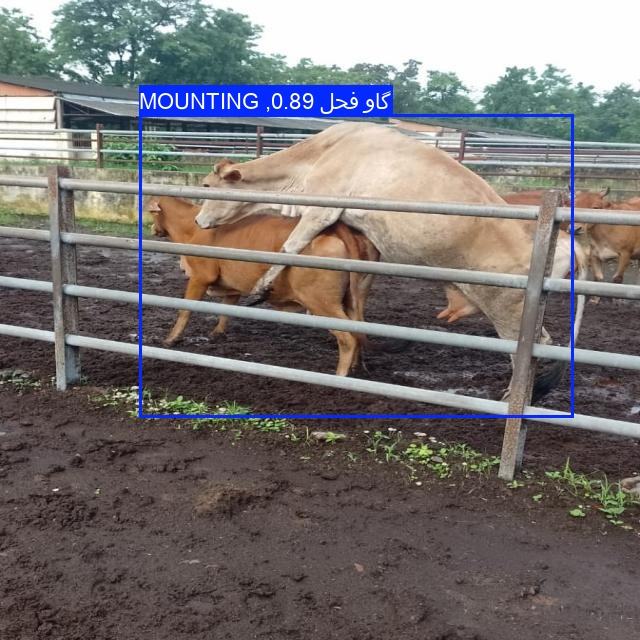

In [ ]:
Image ('runs/detect/exp7/cow2.jpg')

#**Train By Yolov5L epoch=20**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python train.py --img 640 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/dataset.yaml --weights yolov5l.pt

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights  /content/yolov5_ws/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

In [ ]:
 %reload_ext tensorboard

#**Train By Yolov5S epoch=30**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python train.py --img 640 --batch 16 --epochs 30 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights yolov5s.pt

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      20/29      4.37G      0.015    0.01006          0         46        640:  50% 130/260 [01:27<02:03,  1.05it/s]/content/drive/.shortcut-targets-by-id/1H4Li6SvyjfdlVj9XAHMn2pQLNFAREoqX/yolos/yolov5_bkh/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      20/29      4.37G    0.01503    0.01006          0         43        640:  50% 131/260 [01:27<01:36,  1.33it/s]/content/drive/.shortcut-targets-by-id/1H4Li6SvyjfdlVj9XAHMn2pQLNFAREoqX/yolos/yolov5_bkh/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      20/29      4.37G    0.01499    0.01003          0         33        640:  51% 132/260 [01:28<01:42,  1.24it/s]/content/drive/.shortc

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp3/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp8/cow2.jpg')

#**Train By Yolov5M epoch=30**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python train.py --img 640 --batch 16 --epochs 30 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights yolov5m.pt

/content/drive/MyDrive/yolos/yolov5_bkh/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 16.0 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-10-21 23:44:09.458651: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-21 23:44:09.483828: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has alr

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp8/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

/content/drive/MyDrive/yolos/yolov5_bkh/yolov5
detect: weights=['/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp8/weights/best.pt'], source=/content/drive/MyDrive/yolos/dataset/cow2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-377-g24ee2801 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/drive/MyDrive/yolos/dataset/cow2.jpg: 640x640 1 MOUNTING ,گاو فحل, 1517.8ms
Speed: 11.6ms pre-process, 1517.8ms inference, 31.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect

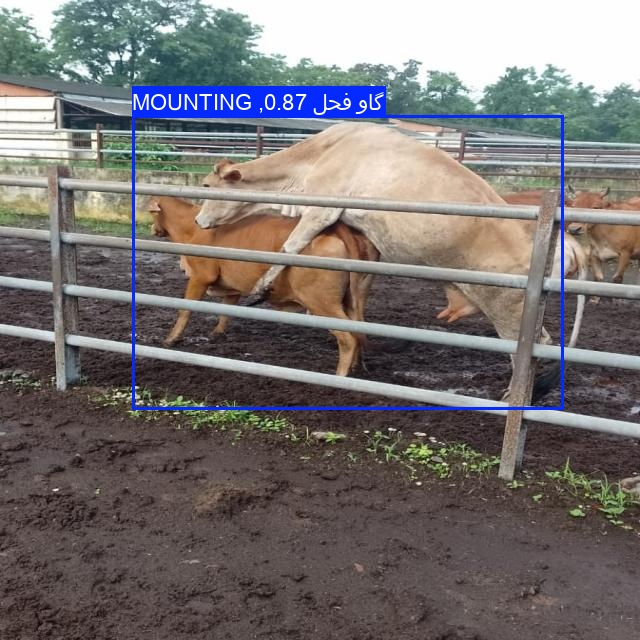

In [ ]:
Image ('runs/detect/exp9/cow2.jpg')

#**Train By Yolov5L epoch=100**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data /content/drive/MyDrive/yolos/yolov5_bkh/data/Estrus.yaml --weights yolov5l.pt

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights  /content/yolov5_ws/yolov5/runs/train/exp6/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
image_path = "runs/detect/exp/cow2.jpg"
display(Image.open(image_path))

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

You can download the source original images from the author site at who retain the rights on the image: https://www.pexels.com/photo/a-group-of-skaters-with-their-skateboards-on-the-sidewalk-6337382/

#**Robofloww اموزش با**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh
if not os.path.exists('roboflow'):
  os.mkdir('roboflow')
%cd roboflow
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

In [ ]:
!pip install torch torchvision torchaudio

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="FEADSojfwNpe2wNrEJxM")
project = rf.workspace("eflag").project("all_3")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to all_3-1 in yolov5pytorch:: 100%|██████████| 5203/5203 [01:10<00:00, 73.71it/s]


#**Train By Yolov5S epoch=50**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 50 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5s.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

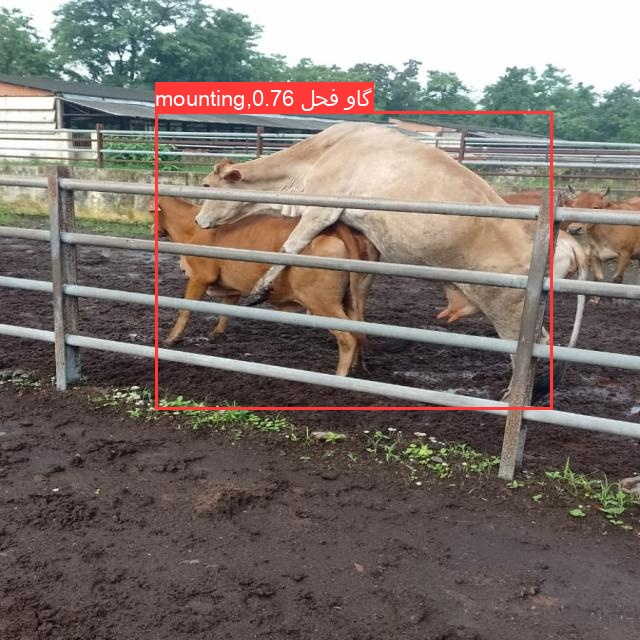

In [ ]:
Image ('runs/detect/exp16/cow2.jpg')

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow3.jpg

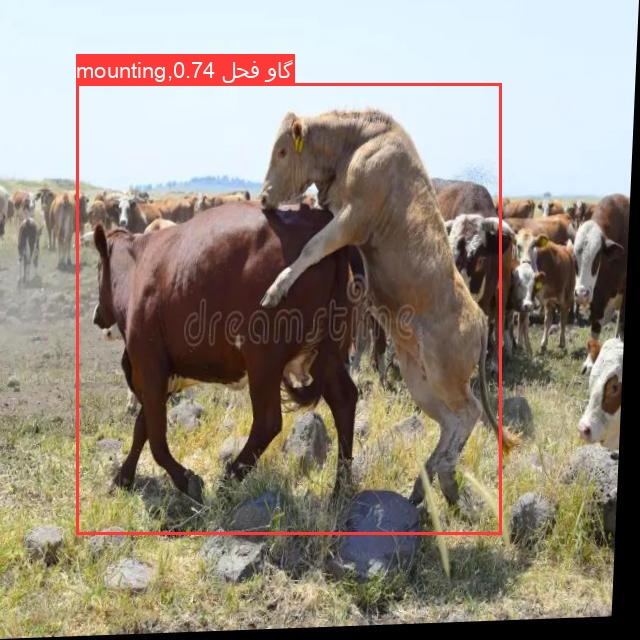

In [ ]:
Image ('runs/detect/exp18/cow3.jpg')

In [ ]:
import shutil
import os, sys

#**Train By Yolov5M epoch=50**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 50 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5m.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp3/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp17/cow2.jpg')

#**Train By Yolov5L epoch=50**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 50 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5l.pt

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights  /content/yolov5_ws/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

#**Train By Yolov5S epoch=100**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5s.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

#**Train By Yolov5M epoch=100**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5m.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

#**Train By Yolov5L epoch=100**

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data /content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5/all_3-1/data.yaml --weights yolov5l.pt

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5
!python detect.py --weights  /content/yolov5_ws/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolos/dataset/cow2.jpg

In [ ]:
image_path = "runs/detect/exp/cow2.jpg"
display(Image.open(image_path))

In [ ]:
Image ('runs/detect/exp/cow2.jpg')

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='Newcow.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = ' گرفتن عکسCapture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to Newcow.jpg


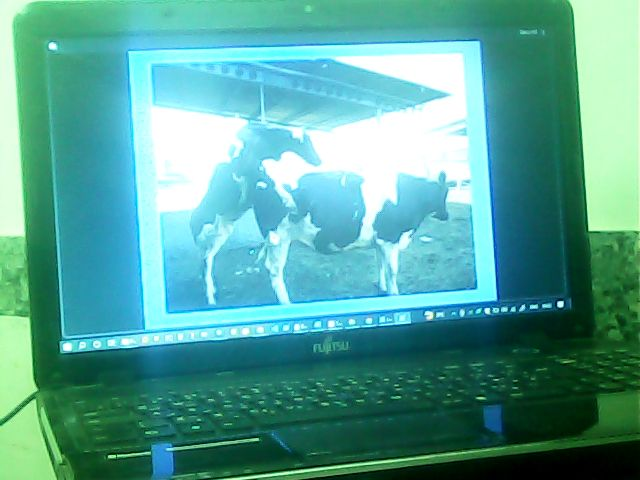

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  #Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
!python /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/detect.py --source Newcow.jpg  --weights /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp8/weights/best.pt
#Image ('runs/detect/exp/Newcow.jpg')

detect: weights=['/content/drive/MyDrive/yolos/yolov5_bkh/yolov5/runs/train/exp8/weights/best.pt'], source=Newcow.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-377-g24ee2801 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/drive/MyDrive/yolos/yolov5_bkh/yolov5/Newcow.jpg: 480x640 1 MOUNTING ,گاو فحل, 1184.8ms
Speed: 3.9ms pre-process, 1184.8ms inference, 1.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp27


/content/drive/MyDrive/yolos/yolov5_bkh/yolov5


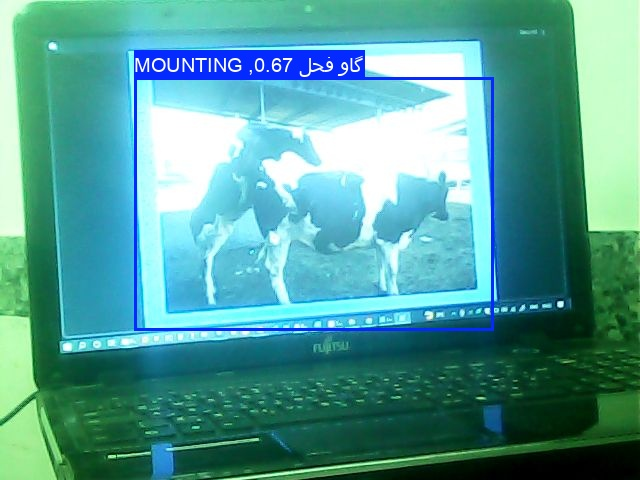

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/yolov5/
Image ('runs/detect/exp27/Newcow.jpg')

[Errno 2] No such file or directory: '/content/drive/MyDrive/yolos/yolov5_bkh/roboflow/yolov5'
/content/drive/MyDrive/yolos/yolov5_bkh/yolov5


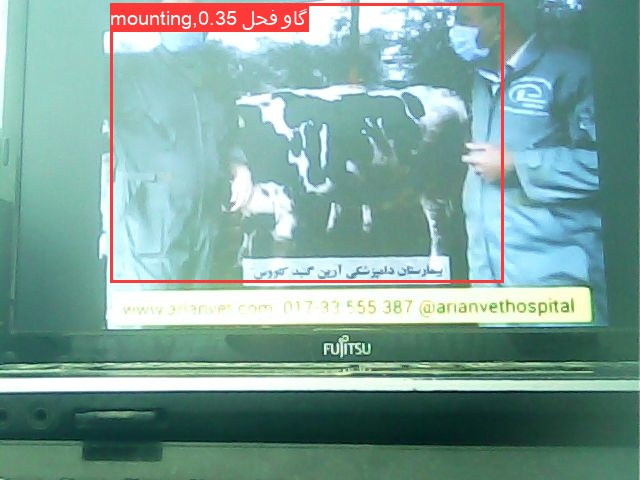

In [ ]:
%cd {CD_ROOT}/yolov5_bkh/roboflow/yolov5
Image ('runs/detect/exp16/photo.jpg')

In [ ]:
#@title Configure Gemini API key

import google.generativeai as genai
from google.colab import userdata

gemini_api_secret_name = 'GOOGLE_API_KEY'  # @param {type: "string"}

try:
  GOOGLE_API_KEY=userdata.get(gemini_api_secret_name)
  genai.configure(api_key=GOOGLE_API_KEY)
except userdata.SecretNotFoundError as e:
   print(f'Secret not found\n\nThis expects you to create a secret named {gemini_api_secret_name} in Colab\n\nVisit https://makersuite.google.com/app/apikey to create an API key\n\nStore that in the secrets section on the left side of the notebook (key icon)\n\nName the secret {gemini_api_secret_name}')
   raise e
except userdata.NotebookAccessError as e:
  print(f'You need to grant this notebook access to the {gemini_api_secret_name} secret in order for the notebook to access Gemini on your behalf.')
  raise e
except Exception as e:
  # unknown error
  print(f"There was an unknown error. Ensure you have a secret {gemini_api_secret_name} stored in Colab and it's a valid key from https://makersuite.google.com/app/apikey")
  raise e

In [ ]:
#connect to the API and send an example message

text = 'What is the velocity of an unladen swallow?' #@param {type: 'string'}

model = genai.GenerativeModel('gemini-pro')
chat = model.start_chat(history=[])

response = chat.send_message(text)
response.text

In [ ]:
!pip install opencv_python

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
cv.namedWindow(winname='my')
while True:
     cv.imshow('my',img)
     if cv.waitKey(1) & 0xFF == 27:
         break
cv.destroyAllWindows()

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow('/content/drive/MyDrive/photos /DSC_1022.jpg')

In [ ]:
!curl -o logo.png https://colab.research.google.com/img/colab_favicon_256px.png
import cv2
img = cv2.imread('logo.png', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [ ]:
import cv2

videoCaptureObject = cv2.VideoCapture(0)
result = True
while(result):
    ret,frame = videoCaptureObject.read()
    cv2.imshow("NewPicture.jpg",frame)
    result = False
videoCaptureObject.release()
cv2.destroyAllWindows()

In [ ]:
import cv2

videoCaptureObject = cv2.VideoCapture(0)
while(True):
    ret,frame = videoCaptureObject.read()
    cv2.imshow('Capturing Video',frame)
    cv2.imwrite("New1Picture.jpg",frame)
    if(cv2.waitKey(1) & 0xFF == ord('q')):
        videoCaptureObject.release()
        cv2.destroyAllWindows()

In [ ]:
from google.colab.patches import cv2_imshow

For example, here we download and display a PNG image of the Colab logo:

In [ ]:
!python detect.py --source 0
#Image ('runs/detect/exp/photo.jpg')

In [ ]:
!git clone https://github.com/ultralytics/yolov5


fatal: destination path 'yolov5' already exists and is not an empty directory.
